In [116]:
import pandas as pd
import warnings
import joblib
import pickle

In [117]:
df = pd.read_csv('drug data_csv.csv')

In [118]:
df

,Cell_Line_Name,Drug_Name,Cosmic_ID,Drug_ID,TCGA_Classification,PSA,Tissue,Tissue_Sub-type,IS_Mutated,IC50
0,697,Zoledronate,906800,1802,UNCLASSIFIED,2.0,blood,lymphoblastic_leukemia,0,2.324538
1,697,ZM447439,906800,1050,UNCLASSIFIED,10.0,blood,lymphoblastic_leukemia,0,-0.758715
2,697,YK-4-279,906800,1239,UNCLASSIFIED,20.0,blood,lymphoblastic_leukemia,0,-0.571283
3,697,XAV939,906800,1268,UNCLASSIFIED,10.0,blood,lymphoblastic_leukemia,0,4.316320
4,697,WZ4003,906800,1614,UNCLASSIFIED,10.0,blood,lymphoblastic_leukemia,0,2.138157
...,...,...,...,...,...,...,...,...,...,...
243461,ZR-75-30,615590,909907,1839,BRCA,3.0,breast,breast,0,4.222822
243462,ZR-75-30,150412,909907,1836,BRCA,3.0,breast,breast,0,4.274296
243463,ZR-75-30,123829,909907,1820,BRCA,3.0,breast,breast,0,4.683226
243464,ZR-75-30,123138,909907,1824,BRCA,1.0,breast,breast,0,4.137158


In [119]:
columns_to_remove = ['Cell_Line_Name', 'Drug_Name']
df= df.drop(columns_to_remove, axis=1)

In [120]:
df

,Cosmic_ID,Drug_ID,TCGA_Classification,PSA,Tissue,Tissue_Sub-type,IS_Mutated,IC50
0,906800,1802,UNCLASSIFIED,2.0,blood,lymphoblastic_leukemia,0,2.324538
1,906800,1050,UNCLASSIFIED,10.0,blood,lymphoblastic_leukemia,0,-0.758715
2,906800,1239,UNCLASSIFIED,20.0,blood,lymphoblastic_leukemia,0,-0.571283
3,906800,1268,UNCLASSIFIED,10.0,blood,lymphoblastic_leukemia,0,4.316320
4,906800,1614,UNCLASSIFIED,10.0,blood,lymphoblastic_leukemia,0,2.138157
...,...,...,...,...,...,...,...,...
243461,909907,1839,BRCA,3.0,breast,breast,0,4.222822
243462,909907,1836,BRCA,3.0,breast,breast,0,4.274296
243463,909907,1820,BRCA,3.0,breast,breast,0,4.683226
243464,909907,1824,BRCA,1.0,breast,breast,0,4.137158


In [121]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import OneHotEncoder

In [122]:
import xgboost as xgb
import catboost 
from catboost import CatBoostRegressor, Pool

In [123]:
nan_values=df.isna().sum()
nan_values

Cosmic_ID                 0
Drug_ID                   0
TCGA_Classification    1067
PSA                       0
Tissue                  359
Tissue_Sub-type         359
IS_Mutated                0
IC50                      0
dtype: int64

In [124]:
df= df.dropna()


In [125]:
nan_values=df.isna().sum()
nan_values

Cosmic_ID              0
Drug_ID                0
TCGA_Classification    0
PSA                    0
Tissue                 0
Tissue_Sub-type        0
IS_Mutated             0
IC50                   0
dtype: int64

In [126]:
df['TCGA_Classification'] = df['TCGA_Classification'].astype(str)

df['Tissue'] = df['Tissue'].astype(str)
df['Tissue_Sub-type'] = df['Tissue_Sub-type'].astype(str)

/tmp/ipykernel_5019/741288072.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['TCGA_Classification'] = df['TCGA_Classification'].astype(str)
/tmp/ipykernel_5019/741288072.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Tissue'] = df['Tissue'].astype(str)
/tmp/ipykernel_5019/741288072.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pyda

In [127]:
X = df.drop('IC50', axis=1)  # Replace "target_variable" with the name of your target variable column
y = df["IC50"]

In [128]:
X

,Cosmic_ID,Drug_ID,TCGA_Classification,PSA,Tissue,Tissue_Sub-type,IS_Mutated
0,906800,1802,UNCLASSIFIED,2.0,blood,lymphoblastic_leukemia,0
1,906800,1050,UNCLASSIFIED,10.0,blood,lymphoblastic_leukemia,0
2,906800,1239,UNCLASSIFIED,20.0,blood,lymphoblastic_leukemia,0
3,906800,1268,UNCLASSIFIED,10.0,blood,lymphoblastic_leukemia,0
4,906800,1614,UNCLASSIFIED,10.0,blood,lymphoblastic_leukemia,0
...,...,...,...,...,...,...,...
243461,909907,1839,BRCA,3.0,breast,breast,0
243462,909907,1836,BRCA,3.0,breast,breast,0
243463,909907,1820,BRCA,3.0,breast,breast,0
243464,909907,1824,BRCA,1.0,breast,breast,0


In [129]:
y

0         2.324538
1        -0.758715
2        -0.571283
3         4.316320
4         2.138157
            ...   
243461    4.222822
243462    4.274296
243463    4.683226
243464    4.137158
243465    4.743439
Name: IC50, Length: 242399, dtype: float64

In [130]:
print(df.dtypes)


Cosmic_ID                int64
Drug_ID                  int64
TCGA_Classification     object
PSA                    float64
Tissue                  object
Tissue_Sub-type         object
IS_Mutated               int64
IC50                   float64
dtype: object


In [131]:
from sklearn import preprocessing

In [132]:
lbl=preprocessing.LabelEncoder()

In [133]:
X['TCGA_Classification']

0         UNCLASSIFIED
1         UNCLASSIFIED
2         UNCLASSIFIED
3         UNCLASSIFIED
4         UNCLASSIFIED
              ...     
243461            BRCA
243462            BRCA
243463            BRCA
243464            BRCA
243465            BRCA
Name: TCGA_Classification, Length: 242399, dtype: object

In [134]:

# encoded_feature1 = lbl.fit_transform(X['TCGA_Classification'])

# # Print the original labels and their corresponding integer values for feature 1
# for label, encoded_value in zip(X['TCGA_Classification'],encoded_feature1):
#     print(f"Feature 1 - Label: {label}  Encoded Value: {encoded_value}")

# encoded_feature2 = lbl.fit_transform(X['Tissue'])

# # Print the original labels and their corresponding integer values for feature 1
# for label, encoded_value in zip(X['Tissue'],encoded_feature2):
#     print(f"Feature 2 - Label: {label}  Encoded Value: {encoded_value}")

# encoded_feature3 = lbl.fit_transform(X['Tissue_Sub-type'])

# # Print the original labels and their corresponding integer values for feature 1
# for label, encoded_value in zip(X['Tissue_Sub-type'],encoded_feature3):
#     print(f"Feature 3 - Label: {label}  Encoded Value: {encoded_value}")

Feature 1 - Label: UNCLASSIFIED  Encoded Value: 31
Feature 1 - Label: UNCLASSIFIED  Encoded Value: 31
Feature 1 - Label: UNCLASSIFIED  Encoded Value: 31
Feature 1 - Label: UNCLASSIFIED  Encoded Value: 31
Feature 1 - Label: UNCLASSIFIED  Encoded Value: 31
Feature 1 - Label: UNCLASSIFIED  Encoded Value: 31
Feature 1 - Label: UNCLASSIFIED  Encoded Value: 31
Feature 1 - Label: UNCLASSIFIED  Encoded Value: 31
Feature 1 - Label: UNCLASSIFIED  Encoded Value: 31
Feature 1 - Label: UNCLASSIFIED  Encoded Value: 31
Feature 1 - Label: UNCLASSIFIED  Encoded Value: 31
Feature 1 - Label: UNCLASSIFIED  Encoded Value: 31
Feature 1 - Label: UNCLASSIFIED  Encoded Value: 31
Feature 1 - Label: UNCLASSIFIED  Encoded Value: 31
Feature 1 - Label: UNCLASSIFIED  Encoded Value: 31
Feature 1 - Label: UNCLASSIFIED  Encoded Value: 31
Feature 1 - Label: UNCLASSIFIED  Encoded Value: 31
Feature 1 - Label: UNCLASSIFIED  Encoded Value: 31
Feature 1 - Label: UNCLASSIFIED  Encoded Value: 31
Feature 1 - Label: UNCLASSIFIED

In [108]:
X['TCGA_Classification']=lbl.fit_transform(X['TCGA_Classification'].astype(str))
X['Tissue']=lbl.fit_transform(X['Tissue'].astype(str))
X['Tissue_Sub-type']=lbl.fit_transform(X['Tissue_Sub-type'].astype(str))

In [109]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=1)

In [110]:
X_train

,Cosmic_ID,Drug_ID,TCGA_Classification,PSA,Tissue,Tissue_Sub-type,IS_Mutated
98533,909976,1510,31,10.0,1,3,0
191988,1298537,1613,16,5.0,6,27,1
69953,1240146,1553,16,10.0,6,27,0
228516,753621,1549,8,10.0,0,42,0
47631,1290798,1913,3,10.0,3,11,0
...,...,...,...,...,...,...,...
230008,924248,1922,31,10.0,10,47,0
5192,906804,1828,31,3.0,12,44,0
209490,1299059,1832,10,3.0,0,22,0
230500,946355,1816,8,1.0,0,42,0


In [111]:
import time
import numpy as np

In [112]:
start=time.time()
xgbr=xgb.XGBRegressor(n_estimators=1000,learning_rate=0.1)


In [113]:
xgbr.fit(X_train,y_train)
y_pred=xgbr.predict(X_test)

from sklearn.metrics import r2_score as RSquared


xgb_rmse=np.sqrt(RSquared(y_test,y_pred))

print("R Squared for XGBoost: ", np.mean(xgb_rmse))

end=time.time()
diff=end-start
print('Excecution Time: ',diff)


R Squared for XGBoost:  0.9112734464782257
Excecution Time:  51.50484657287598


In [139]:
input_data = [[909976,1510,31,10,1,3,0]]

In [140]:
input_data = np.array(input_data)
input_data = pd.DataFrame(input_data, columns=['Cosmic_ID', 'Drug_ID', 'TCGA_Classification', 'PSA', 'Tissue', 'Tissue_Sub-type', 'IS_Mutated'])
predictions = xgbr.predict(input_data)
predictions[0]

3.887653

In [ ]:
from sklearn.metrics import mean_squared_error

y_pred = xgbr.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
print("MSE:", mse)


MSE: 1.3097130298110755


In [ ]:
from sklearn.metrics import mean_absolute_error

mae = mean_absolute_error(y_test, y_pred)
print("MAE:", mae)


MAE: 0.8467012637617617


In [ ]:

rmse = mean_squared_error(y_test, y_pred, squared=False)
print("RMSE:", rmse)


RMSE: 1.144426943850535


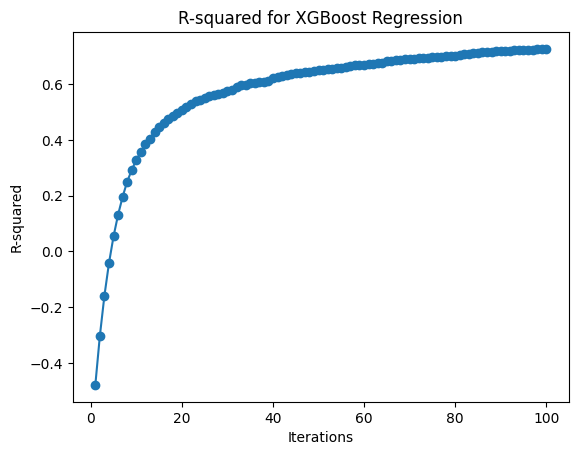

In [ ]:
import numpy as np
import xgboost as xgb
from sklearn.metrics import r2_score
import matplotlib.pyplot as plt


# Lists to store the iterations or model parameters and R-squared values
iterations = []
r_squared_values = []

# Train the XGBoost model and calculate R-squared values
for iteration in range(1, 101):
    xgbr.set_params(n_estimators=iteration)
    xgbr.fit(X_train, y_train)
    y_pred = xgbr.predict(X_test)
    r_squared = r2_score(y_test, y_pred)
    iterations.append(iteration)
    r_squared_values.append(r_squared)

# Plot the R-squared values
plt.plot(iterations, r_squared_values, marker='o')
plt.title('R-squared for XGBoost Regression')
plt.xlabel('Iterations')
plt.ylabel('R-squared')
plt.show()


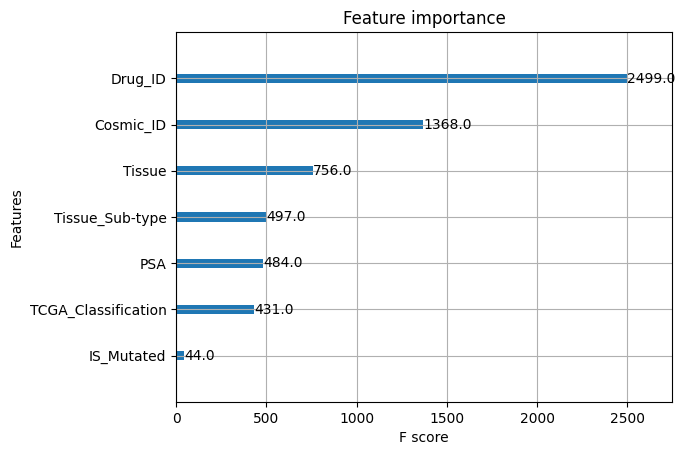

In [ ]:

xgb.plot_importance(xgbr)
plt.show()


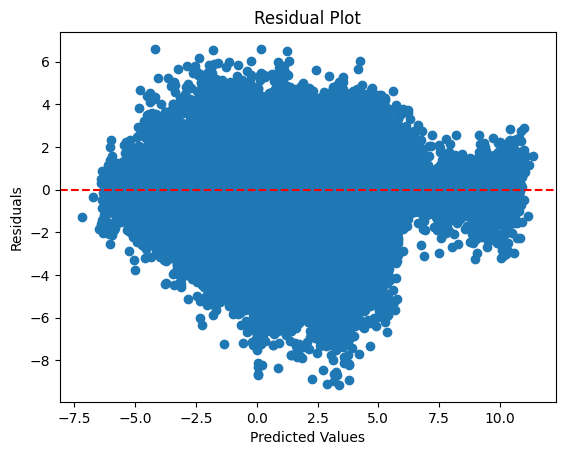

In [ ]:

# Make predictions on the training data
y_pred = xgbr.predict(X_train)

residuals = y_train - y_pred

plt.scatter(y_pred, residuals)
plt.axhline(y=0, color='red', linestyle='--')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Residual Plot')
plt.show()


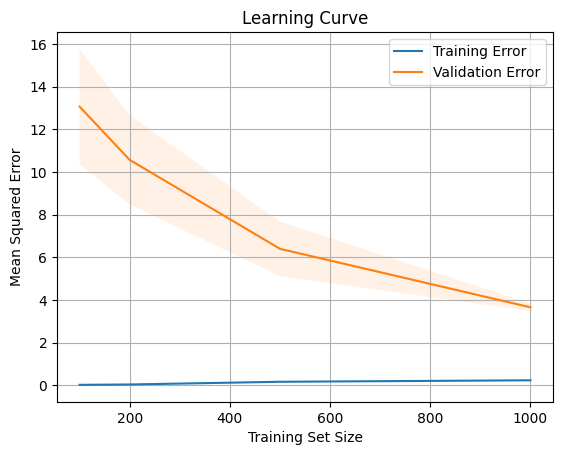

In [ ]:
from sklearn.model_selection import learning_curve
from xgboost import XGBRegressor

# Define the training set sizes or number of iterations
train_sizes = [100, 200, 500, 1000]

# Calculate the learning curve
train_sizes, train_scores, validation_scores = learning_curve(
    XGBRegressor(), X, y, train_sizes=train_sizes, cv=5, scoring='neg_mean_squared_error'
)

# Convert the negative mean squared errors to positive values
train_scores = -train_scores
validation_scores = -validation_scores

# Calculate the mean and standard deviation of the performance scores
train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
validation_mean = np.mean(validation_scores, axis=1)
validation_std = np.std(validation_scores, axis=1)

# Plot the learning curve
plt.plot(train_sizes, train_mean, label='Training Error')
plt.plot(train_sizes, validation_mean, label='Validation Error')

# Plot the shaded area representing the standard deviation
plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.1)
plt.fill_between(train_sizes, validation_mean - validation_std, validation_mean + validation_std, alpha=0.1)

# Customize the plot
plt.xlabel('Training Set Size')
plt.ylabel('Mean Squared Error')
plt.title('Learning Curve')
plt.legend(loc='best')
plt.grid(True)
plt.show()


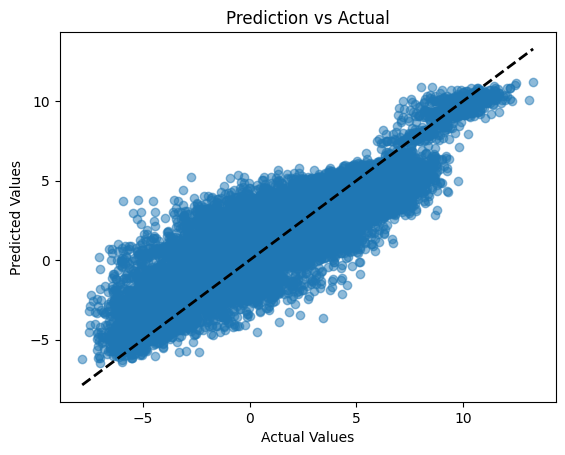

In [ ]:

# Make predictions on the test set
y_pred = xgbr.predict(X_test)

# Plot the prediction vs actual values
plt.scatter(y_test, y_pred, alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Prediction vs Actual')
plt.show()


In [ ]:
pickle.dump(xgbr,open('cancer.pkl','wb'))
model=pickle.load(open('cancer.pkl','rb'))